### Imports

In [1]:
import tensorflow as tf
print("GPU: ", (len(tf.config.experimental.list_physical_devices("GPU"))))

from tensorflow.python.client import device_lib
import numpy as np
np.random.seed(1444)
import pandas as pd
import matplotlib.pyplot as plt
import os
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout

from tensorflow.keras.layers import BatchNormalization
from sklearn.model_selection import GridSearchCV
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from keras.callbacks import TensorBoard
pd.set_option('display.max_columns', 60)
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
from tensorflow.keras.layers import Activation

print(device_lib.list_local_devices())


os.chdir(r"C:\Users\Áron\Desktop\Courses\csgo-ai-competition-master\dataset_initial")

GPU:  1


Using TensorFlow backend.


[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 16482555537132576262
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 3138361753
locality {
  bus_id: 1
  links {
  }
}
incarnation: 7674959761724923634
physical_device_desc: "device: 0, name: GeForce GTX 1050 Ti, pci bus id: 0000:01:00.0, compute capability: 6.1"
]


### Getting the data

In [2]:
%%time
def read_dataset(template, start_idx, end_idx):
    frames = [ pd.read_json(f) for f in [template.format(i) for i in range(start_idx, end_idx+1)] ]
    return pd.concat(frames, ignore_index = True)
    
X = read_dataset("dataset_{:02}.json", 0, 24)
y = X.pop('round_winner').map(lambda s: 0 if s == "CT" else 1)

Wall time: 16.6 s


In [3]:
X

,map,patch_version,map_crc,current_score,round_status,round_status_time_left,alive_players,active_smokes,active_molotovs,previous_kills,planted_bomb
0,de_dust2,13737,702125823,"[0, 0]",FreezeTime,20.000000,"[{'health': 100, 'armor': 0, 'has_helmet': Fal...",[],[],[],None
1,de_dust2,13737,702125823,"[0, 0]",FreezeTime,1.031250,"[{'health': 100, 'armor': 100, 'has_helmet': F...",[],[],[],None
2,de_dust2,13737,702125823,"[0, 0]",Normal,96.031250,"[{'health': 100, 'armor': 100, 'has_helmet': F...",[],[],"[{'weapon': 'Glock', 'attacker_position': {'x'...",None
3,de_dust2,13737,702125823,"[0, 0]",Normal,76.031250,"[{'health': 100, 'armor': 100, 'has_helmet': F...","[{'position': {'x': 1184.4062, 'y': 2223.8438,...",[],"[{'weapon': 'Glock', 'attacker_position': {'x'...",None
4,de_dust2,13737,702125823,"[1, 0]",FreezeTime,19.968750,"[{'health': 100, 'armor': 100, 'has_helmet': F...",[],[],[],None
...,...,...,...,...,...,...,...,...,...,...,...
122405,de_train,13732,2742246669,"[11, 14]",BombPlanted,15.414062,"[{'health': 100, 'armor': 99, 'has_helmet': Tr...","[{'position': {'x': 1262.8438, 'y': -1086.625,...",[],"[{'weapon': 'Awp', 'attacker_position': {'x': ...","{'site': 'B', 'position': {'x': -234.09375, 'y..."
122406,de_train,13732,2742246669,"[11, 15]",FreezeTime,19.929688,"[{'health': 100, 'armor': 95, 'has_helmet': Tr...",[],[],[],None
122407,de_train,13732,2742246669,"[11, 15]",Normal,114.929690,"[{'health': 100, 'armor': 95, 'has_helmet': Tr...",[],[],[],None
122408,de_train,13732,2742246669,"[11, 15]",Normal,94.929690,"[{'health': 100, 'armor': 95, 'has_helmet': Tr...","[{'position': {'x': -643.875, 'y': -918.90625,...","[{'position': {'x': -945.34375, 'y': 388.84375...",[],None


In [4]:
y

0         0
1         0
2         0
3         0
4         0
         ..
122405    1
122406    1
122407    1
122408    1
122409    1
Name: round_winner, Length: 122410, dtype: int64

# Data Cleaning

#### 1. Removing rows that have empty positions - restart rounds

In [5]:
todrop = []
for row in range(len(X["alive_players"])):
    for k in X["alive_players"][row]:
        if k.get("position_history") == []:
            todrop.append(row)
X = X.drop(X.index[todrop]).reset_index(drop=True)
y = y.drop(y.index[todrop]).reset_index(drop=True)


print(f"{len(todrop)} rows droppped!")

120 rows droppped!


# Feature Engineering

#### 1. Making every map into a 3x3 gird and counting players in all the grids


In [6]:
%%time
map_coords = {
    "de_cache":    (-2000, 3250),
    "de_dust2":    (-2476, 3239),
    "de_inferno":  (-2087, 3870),
    "de_mirage":   (-3230, 1713),
    "de_nuke":     (-3453, 2887),
    "de_overpass": (-4831, 1781),
    "de_train":    (-2477, 2392),
    "de_vertigo":  (-3168, 1762),
}

map_len = {
    "de_cache":    5500,
    "de_dust2":    4400,
    "de_inferno":  4900,
    "de_mirage":   5000,
    "de_nuke":     7000,
    "de_overpass": 5200,
    "de_train":    4700,
    "de_vertigo":  4000,
}

last_positions_ct = []
last_positions_t = []
for row in X["alive_players"]:
    for i in row:
        pos = i.get("position_history")
        if i.get("team") =="CT":
            last_positions_ct.append(pos[len(pos)-1])
        else:
            last_positions_t.append(pos[len(pos)-1])
    last_positions_t.append("next_row")
    last_positions_ct.append("next_row")
    

def get_sector(map_name, x, y):
    diff = map_len.get(map_name) / 3
    lower_limit_x = map_coords.get(map_name)[0]
    upper_limit_y = map_coords.get(map_name)[1]
    upper_limit_x = lower_limit_x + diff
    lower_limit_y = upper_limit_y - diff
    for row in range(1,4):
        lower_limit_x = map_coords.get(map_name)[0]
        upper_limit_x = lower_limit_x + diff
        lower_limit_y = upper_limit_y - diff
        for column in range(1,4):
            if x > lower_limit_x and x < upper_limit_x and y < upper_limit_y and y > lower_limit_y:
                return str(row)+str(column)
            lower_limit_x = upper_limit_x
            upper_limit_x += diff           
        upper_limit_y -= diff        
 
def setup_sectors(map_name, last_position):   
    if last_position == "next_row":
        return "next_row"
    else:
        return get_sector(map_name, last_position.get("x"), last_position.get("y"))
        

def sectors(last_positions_list):
    index = 0    
    sectors = []
    for i in last_positions_list:
        if setup_sectors(X["map"][index], i) == "next_row":
            sectors.append("next_row")
            index += 1
        else:
            sectors.append(setup_sectors(X["map"][index], i))
    return sectors

   
def sector_columns(sector_list):
    s1, s2, s3, s4, s5, s6, s7, s8, s9 = ([] for i in range(9))
    s1_count, s2_count, s3_count, s4_count, s5_count, s6_count, s7_count, s8_count, s9_count = (0 for i in range(9))
    for i in sector_list:
        if i == "next_row":
            s1.append(s1_count)
            s2.append(s2_count)
            s3.append(s3_count)
            s4.append(s4_count)
            s5.append(s5_count)
            s6.append(s6_count)
            s7.append(s7_count)
            s8.append(s8_count)
            s9.append(s9_count)
            s1_count, s2_count, s3_count, s4_count, s5_count, s6_count, s7_count, s8_count, s9_count = (0 for i in range(9))
        else:
            if i == "11":
                s1_count += 1
            elif i == "12":
                s2_count += 1
            elif i == "13":
                s3_count += 1
            elif i == "21":
                s4_count += 1
            elif i == "22":
                s5_count += 1
            elif i == "23":
                s6_count += 1
            elif i == "31":
                s7_count += 1
            elif i == "32":
                s8_count += 1
            elif i == "33":
                s9_count += 1
    return s1,s2,s3,s4,s5,s6,s7,s8,s9
 
for index in range(1, 10):
    X["CTs_in_sector_"+str(index)] = sector_columns(sectors(last_positions_ct))[index-1]
    X["Ts_in_sector_"+str(index)] = sector_columns(sectors(last_positions_t))[index-1]

Wall time: 6min 2s


#### 2. Transforming the score into leading team and leading by how much


In [7]:
%%time
def lead_round_diff():
    team = []
    diff = [] 
    for score in X["current_score"]:
        if score[0] > score[1]:
            team.append("CT")
            diff.append(score[0] - score[1])
        elif score[0] < score[1]:
            team.append("Terrorist")
            diff.append(score[1] - score[0])
        else:
            team.append("draw")
            diff.append(0)
    return team, diff

X["leading_team"] = lead_round_diff()[0]
X["round_difference"] = lead_round_diff()[1]
X.drop(["current_score"], axis = 1, inplace = True)

Wall time: 356 ms


In [8]:
y

0         0
1         0
2         0
3         0
4         0
         ..
122290    1
122291    1
122292    1
122293    1
122294    1
Name: round_winner, Length: 122295, dtype: int64

#### 3. Using inventory data to make number of AWPs  and grenades and active utility, later firepower feature

In [9]:
%%time
def setup_inventory(team):
    inventory_list = []
    for roundn in X["alive_players"]:
        for players in roundn:
            for inventory in players["inventory"]:
                if players["team"] == team:
                    inventory_list.append(inventory)
        inventory_list.append("NEXT_ROW")
    return inventory_list


def detect_weapon(inventory_list, weapon):
    weapon_count = 0
    weapon_in_round = []
    for item in inventory_list:
        if item != "NEXT_ROW" and item["item_type"] == weapon:
            weapon_count += 1  
        elif item == "NEXT_ROW":
            weapon_in_round.append(weapon_count)
            weapon_count = 0
    return weapon_in_round
        

grenades = ["Flashbang", "HeGrenade", "SmokeGrenade", "IncendiaryGrenade", 
            "MolotovGrenade","DecoyGrenade"]
def detect_grenades(inventory_list):
    grenades_on_given_side = []
    grenade_count = 0
    for item in inventory_list:
        if item != "NEXT_ROW" and item["item_type"] in grenades:
            grenade_count += item["clip_ammo"]
        if item == "NEXT_ROW":
            grenades_on_given_side.append(grenade_count)
            grenade_count = 0
    return grenades_on_given_side


def active_utility_count(utility_column):
    active_util = []
    for item in X[utility_column]:
        active_util.append(len(item))
    return active_util


t_inventory = setup_inventory("Terrorist")
ct_inventory = setup_inventory("CT")          
X["t_awps"] = np.array(detect_weapon(t_inventory, "Awp"))
X["ct_awps"] = np.array(detect_weapon(ct_inventory, "Awp"))       
X["ct_grenades"] = np.array(detect_grenades(ct_inventory))
X["t_grenades"] = np.array(detect_grenades(t_inventory))
X["active_smokes_count"] = np.array(active_utility_count("active_smokes"))
X["active_molotovs_count"] = np.array(active_utility_count("active_molotovs"))
X.drop(["active_smokes"], axis = 1, inplace = True)
X.drop(["active_molotovs"], axis = 1, inplace = True)

Wall time: 3.12 s


#### 4. Getting the basics - money, health, defuser, armor, alive players

In [10]:
%%time
def get_attr(ds, team, attr=None):
    team_players = map(lambda players: filter(lambda p: p["team"] == team, players), 
                       ds['alive_players'])
    if attr:
        team_players = map(lambda players: map(lambda p: p[attr], players), team_players)
    
    return list(map(lambda p: list(p), team_players))

for ds in [X]:
    ds['alive_players_t']  = list(map(len ,get_attr(ds, "Terrorist")))
    ds['alive_players_ct'] = list(map(len, get_attr(ds, "CT")))
    ds['health_ct']        = list(map(sum, get_attr(ds, "CT", "health")))
    ds['health_t']         = list(map(sum, get_attr(ds, "Terrorist", "health")))
    ds['money_ct']         = list(map(sum, get_attr(ds, "CT", "money")))
    ds['money_t']          = list(map(sum, get_attr(ds, "Terrorist", "money")))
    ds['has_defuser']      = list(map(sum, get_attr(ds, "CT", "has_defuser")))
    ds['has_helmet_ct']    = list(map(sum, get_attr(ds, "CT", "has_helmet")))
    ds['has_helmet_t']     = list(map(sum, get_attr(ds, "Terrorist", "has_helmet")))
    ds['armor_ct']         = list(map(sum, get_attr(ds, "CT", "armor")))
    ds['armor_t']          = list(map(sum, get_attr(ds, "Terrorist", "armor")))

Wall time: 8.44 s


#### 5. Calculating firepower - mean of ratio of kill potential and frequency of owning it

In [11]:
%%time
rifles = ["G3sg1", "M4a4", "GalilAr", "M4a1S", "Sg553", "Awp", "Famas" ,
          "Aug", "Ssg08", "Ak47", "Scar20"]
SMGs = ["Ump45", "Mp5sd", "Mac10",  "Mp9", "Mp7", "P90"]
heavy = ["Xm1014", "Mag7", "Nova", "Sawedoff"]
pistols = [ "Deagle", "P250", "Cz75Auto", 
           "FiveSeven", "Tec9", "Elite", "ZeusX27"]
default = ["UspS", "Glock", "P2000"]
all_weapons = rifles + SMGs + heavy + pistols + default  

def get_weapon_count(inventory_list, weapon_name):
    time_left = list(X["round_status_time_left"])
    simple_inventory = []
    index = 0
    for item in inventory_list:
        if item == "NEXT_ROW":
            index += 1                      #time startS at 114.xx next timestamp is 94.xx
        elif item["item_type"] in all_weapons and time_left[index] > 95: 
            simple_inventory.append(item["item_type"])
    #returns the number of times the item was purchased or owned at the beginning
    return simple_inventory.count(weapon_name)

    
def get_weapon_kills(weapon_name):
    weapon_kills = []
    prev_kill =  X["previous_kills"]
    for index in range(1,len(prev_kill)):
        if prev_kill[index] == [] and prev_kill[index-1] != [] :
            for weapon in prev_kill[index-1]:
                weapon_kills.append(weapon["weapon"])
    return weapon_kills.count(weapon_name), len(weapon_kills)


def get_value(weapon_name):
    if get_weapon_kills(weapon_name)[0] == 0:
        return 0
    return get_weapon_kills(weapon_name)[0] / (get_weapon_count(t_inventory, weapon_name) + get_weapon_count(ct_inventory, weapon_name))        
 

def get_score(weapon_name):
    return (np.mean(get_value(weapon_name) + (get_weapon_kills(weapon_name)[0] / get_weapon_kills(weapon_name)[1]))) * 100


weapon_scores_dict = dict(zip(all_weapons, [get_score(item) for item in all_weapons]))

def get_firepower(inventory_list):
    firepower = []
    firepower_sum = 0
    for i in inventory_list:
        if i =="NEXT_ROW":
            firepower.append(firepower_sum)
            firepower_sum = 0
        elif i["item_type"] in all_weapons:
            firepower_sum += weapon_scores_dict.get(i["item_type"])
    return firepower

X["ct_firepower"] = get_firepower(ct_inventory)
X["t_firepower"] = get_firepower(t_inventory)
X.drop(["previous_kills"],axis=1, inplace=True)
X.drop(["alive_players"], axis = 1, inplace = True) 

Wall time: 6min 59s


In [46]:
weapon_scores_dict

{'G3sg1': 9.439785629823367,
 'M4a4': 66.8247460098735,
 'GalilAr': 44.122265710419626,
 'M4a1S': 50.05946448958122,
 'Sg553': 70.86258446903987,
 'Awp': 69.95651456640783,
 'Famas': 45.82054353224899,
 'Aug': 56.54271877403973,
 'Ssg08': 33.1621302005955,
 'Ak47': 74.07308455190484,
 'Scar20': 63.17187081445592,
 'Ump45': 36.24535635605854,
 'Mp5sd': 45.59511261557301,
 'Mac10': 42.230261348927506,
 'Mp9': 43.62097006062445,
 'Mp7': 42.208158660437235,
 'P90': 30.77388946176871,
 'Xm1014': 42.97244549745685,
 'Mag7': 40.97198325835309,
 'Nova': 28.135482058210364,
 'Sawedoff': 0.0,
 'Deagle': 22.940950147197263,
 'P250': 10.476156238591448,
 'Cz75Auto': 18.853947077252766,
 'FiveSeven': 16.827757965188813,
 'Tec9': 12.273794050748743,
 'Elite': 15.81742583943816,
 'ZeusX27': 5.048897077314582,
 'UspS': 10.672472817100173,
 'Glock': 7.584900156559426,
 'P2000': 5.2820552176932205}

#### 6. Bomblant on A B or not planted

In [12]:
%%time
#Separating planted into none, A, B
bomb_plant = []
for row in X["planted_bomb"]:
    if row == None:
        bomb_plant.append("not_planted")
    elif row["site"] == "A":
        bomb_plant.append("planted_on_A")
    else:
        bomb_plant.append("planted_on_B")
        
X["bomb_plant"] = bomb_plant

Wall time: 33.9 ms


In [21]:
X

# Data Preprocessing

#### 1. One hot encoding 

In [14]:
categorical = ["map", "round_status", "leading_team", "bomb_plant"]

In [15]:
OHE_map = pd.get_dummies(X["map"], dtype= int) 
OHE_round_status = pd.get_dummies(X["round_status"], dtype= int, prefix = "round_status") 
OHE_leading_team = pd.get_dummies(X["leading_team"], dtype= int, prefix = "leading_team") 
OHE_bomb_plant = pd.get_dummies(X["bomb_plant"], dtype= int)

In [16]:
X = pd.concat([X, OHE_map, OHE_round_status, OHE_leading_team, OHE_bomb_plant], axis = 1)

In [17]:
X.drop(["map", "round_status", "leading_team", "bomb_plant", "planted_bomb"],axis=1, inplace=True)

In [40]:
columns = X.columns

# Saving file and loading data

In [40]:
os.chdir(r"C:\Users\Áron\Desktop\Courses\csgo-ai-competition-master")
df = pd.concat((pd.DataFrame(X), y), axis = 1)
df.to_csv("processed.csv")

In [41]:
df[:5]

,patch_version,map_crc,round_status_time_left,CTs_in_sector_1,Ts_in_sector_1,CTs_in_sector_2,Ts_in_sector_2,CTs_in_sector_3,Ts_in_sector_3,CTs_in_sector_4,Ts_in_sector_4,CTs_in_sector_5,Ts_in_sector_5,CTs_in_sector_6,Ts_in_sector_6,CTs_in_sector_7,Ts_in_sector_7,CTs_in_sector_8,Ts_in_sector_8,CTs_in_sector_9,Ts_in_sector_9,round_difference,t_awps,ct_awps,ct_grenades,t_grenades,active_smokes_count,active_molotovs_count,alive_players_t,alive_players_ct,health_ct,health_t,money_ct,money_t,has_defuser,has_helmet_ct,has_helmet_t,armor_ct,armor_t,ct_firepower,t_firepower,de_cache,de_dust2,de_inferno,de_mirage,de_nuke,de_overpass,de_train,de_vertigo,round_status_BombPlanted,round_status_FreezeTime,round_status_Normal,leading_team_CT,leading_team_Terrorist,leading_team_draw,not_planted,planted_on_A,planted_on_B,round_winner
0,13737,702125823,20.00000,0,0,5,0,0,0,0,0,0,0,0,0,0,1,0,4,0,0,0,0,0,0,0,0,0,5,5,500,500,4000,4000,0,0,0,0,0,47.971946,37.924501,0,1,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0
1,13737,702125823,1.03125,0,0,5,0,0,0,0,0,0,0,0,0,0,1,0,4,0,0,0,0,0,2,6,0,0,5,5,500,500,600,650,1,0,0,400,300,47.971946,37.924501,0,1,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0
2,13737,702125823,96.03125,1,0,1,0,2,0,0,0,0,0,0,3,0,0,0,1,0,0,0,0,0,2,5,0,0,4,4,391,400,750,500,1,0,0,294,200,42.689891,30.339601,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0
3,13737,702125823,76.03125,1,0,0,0,3,2,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,2,0,4,4,391,400,750,500,1,0,0,294,200,42.689891,28.036756,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0
4,13737,702125823,19.96875,0,0,5,0,0,0,0,0,0,0,0,0,0,2,0,3,0,0,1,0,0,0,0,0,0,5,5,500,500,18350,10750,1,0,0,192,0,47.971946,37.924501,0,1,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0


## Here

In [6]:
os.chdir(r"C:\Users\Áron\Desktop\Courses\csgo-ai-competition-master")
df = pd.read_csv("processed.csv", index_col=0)
X = df.copy()
y = X.pop("round_winner")

In [7]:
X

,patch_version,map_crc,round_status_time_left,CTs_in_sector_1,Ts_in_sector_1,CTs_in_sector_2,Ts_in_sector_2,CTs_in_sector_3,Ts_in_sector_3,CTs_in_sector_4,Ts_in_sector_4,CTs_in_sector_5,Ts_in_sector_5,CTs_in_sector_6,Ts_in_sector_6,CTs_in_sector_7,Ts_in_sector_7,CTs_in_sector_8,Ts_in_sector_8,CTs_in_sector_9,Ts_in_sector_9,round_difference,t_awps,ct_awps,ct_grenades,t_grenades,active_smokes_count,active_molotovs_count,alive_players_t,alive_players_ct,health_ct,health_t,money_ct,money_t,has_defuser,has_helmet_ct,has_helmet_t,armor_ct,armor_t,ct_firepower,t_firepower,de_cache,de_dust2,de_inferno,de_mirage,de_nuke,de_overpass,de_train,de_vertigo,round_status_BombPlanted,round_status_FreezeTime,round_status_Normal,leading_team_CT,leading_team_Terrorist,leading_team_draw,not_planted,planted_on_A,planted_on_B
0,13737,702125823,20.000000,0,0,5,0,0,0,0,0,0,0,0,0,0,1,0,4,0,0,0,0,0,0,0,0,0,5,5,500,500,4000,4000,0,0,0,0,0,47.971946,37.924501,0,1,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0
1,13737,702125823,1.031250,0,0,5,0,0,0,0,0,0,0,0,0,0,1,0,4,0,0,0,0,0,2,6,0,0,5,5,500,500,600,650,1,0,0,400,300,47.971946,37.924501,0,1,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0
2,13737,702125823,96.031250,1,0,1,0,2,0,0,0,0,0,0,3,0,0,0,1,0,0,0,0,0,2,5,0,0,4,4,391,400,750,500,1,0,0,294,200,42.689891,30.339601,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0
3,13737,702125823,76.031250,1,0,0,0,3,2,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,2,0,4,4,391,400,750,500,1,0,0,294,200,42.689891,28.036756,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0
4,13737,702125823,19.968750,0,0,5,0,0,0,0,0,0,0,0,0,0,2,0,3,0,0,1,0,0,0,0,0,0,5,5,500,500,18350,10750,1,0,0,192,0,47.971946,37.924501,0,1,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122290,13732,2742246669,15.414062,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,3,1,0,3,1,0,2,4,2,0,4,2,200,242,100,5950,1,2,4,195,359,131.790662,321.876881,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,1
122291,13732,2742246669,19.929688,0,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,4,1,0,2,2,0,0,5,5,500,500,11500,23900,1,1,2,95,175,120.187110,178.743600,0,0,0,0,0,0,1,0,0,1,0,0,1,0,1,0,0
122292,13732,2742246669,114.929690,0,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,4,1,0,15,20,0,0,5,5,500,500,1200,6700,1,3,5,495,475,165.174016,342.245819,0,0,0,0,0,0,1,0,0,0,1,0,1,0,1,0,0
122293,13732,2742246669,94.929690,0,0,0,0,0,0,0,1,2,3,2,0,0,1,1,0,0,0,4,1,0,7,13,5,3,5,5,500,500,1200,6700,1,3,5,495,475,165.174016,413.108403,0,0,0,0,0,0,1,0,0,0,1,0,1,0,1,0,0


# Feature Scaling

#### 1. Standard scaling

In [8]:
%%time
sc = StandardScaler()
X = sc.fit_transform(X)

Wall time: 239 ms


In [9]:
X[0]

array([ 0.51305434, -1.24380411, -0.96151537, -0.38063133, -0.26571592,
        2.2325287 , -0.30894616, -0.36585648, -0.23744662, -0.25361866,
       -0.46266257, -0.60767951, -0.66785029, -0.62764474, -0.43814828,
       -0.25975133,  0.65439142, -0.40456313,  1.99948724, -0.39749092,
       -0.3872368 , -1.22177076, -0.6741081 , -0.8524139 , -1.01017142,
       -1.01374431, -0.64096106, -0.36775078,  0.59777464,  0.60281443,
        0.66481718,  0.69576905, -0.51605854, -0.59501766, -1.00510529,
       -1.115743  , -1.37988279, -1.83699328, -1.71018123, -1.33945647,
       -1.33059267, -0.03445381,  2.1280759 , -0.49160396, -0.42293259,
       -0.42882789, -0.3605937 , -0.35200989, -0.31626332, -0.354952  ,
        1.62475859, -1.2595426 , -0.86877347, -0.89865093,  2.66893516,
        0.354952  , -0.2491344 , -0.23763682])

#### Splitting the data

In [10]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, shuffle = True, random_state = 42)

# Building the neural network

#### 1. Standard Training

In [11]:
X.shape

(122295, 58)

In [ ]:
os.chdir(r"C:\Users\Áron\Desktop\Courses\csgo-ai-competition-master")
#BEST: BS - 64 LR - 0.001 DO - 0.25 BNM - 0.9
batch_size = 64
dropout = 0.25
lr = 0.001

log_dir = r".\runs\2048_nodes"
tensorboard = TensorBoard(log_dir = log_dir, profile_batch = 100000000)

model = Sequential()

model.add(Dense(128,  input_shape = (58,), kernel_initializer="he_normal"))
model.add(BatchNormalization(momentum = 0.9))
model.add(Activation("relu"))
model.add(Dropout(rate=dropout))

model.add(Dense(2048, kernel_initializer="he_normal"))
model.add(BatchNormalization(momentum = 0.9))
model.add(Activation("relu"))
model.add(Dropout(rate=dropout))

model.add(Dense(2048, kernel_initializer="he_normal"))
model.add(BatchNormalization(momentum = 0.9))
model.add(Activation("relu"))
model.add(Dropout(rate=dropout))


model.add(Dense(1, kernel_initializer="he_normal"))
model.add(BatchNormalization(momentum = 0.9))
model.add(Activation("sigmoid"))

opt = tf.keras.optimizers.Adam(learning_rate = lr )
model.compile(optimizer = opt, loss =  'binary_crossentropy', metrics = ['accuracy'])


model.fit(X_train, y_train, epochs = 3000, validation_data=(X_test, y_test), callbacks = [tensorboard], verbose=0)

### Saving the model

In [30]:
from keras.models import load_model
model.save('dummy_model.h5')

#### 3. Grid search

In [32]:
%%time
from random import randrange
def build_classifier(lr, dropout):
    model = Sequential()

    model.add(Dense(128,  input_shape = (58,), kernel_initializer="he_normal"))
    model.add(BatchNormalization(momentum = 0.9))
    model.add(Activation("relu"))
    model.add(Dropout(rate=dropout))

    model.add(Dense(512, kernel_initializer="he_normal"))
    model.add(BatchNormalization(momentum = 0.9))
    model.add(Activation("relu"))
    model.add(Dropout(rate=dropout))

    model.add(Dense(128, kernel_initializer="he_normal"))
    model.add(BatchNormalization(momentum = 0.9))
    model.add(Activation("relu"))
    model.add(Dropout(rate=dropout))


    model.add(Dense(1, kernel_initializer="he_normal"))
    model.add(BatchNormalization(momentum = 0.9))
    model.add(Activation("sigmoid"))

    opt = keras.optimizers.Adam(learning_rate = lr )
    model.compile(optimizer = opt, loss =  'binary_crossentropy', metrics = ['accuracy'])
    return model

model = KerasClassifier(build_fn= build_classifier )
parameters = {"lr":[0.001, 0.0001],
              "batch_size": [64],
             "dropout":[0.25]}
grid_search = GridSearchCV(estimator=model, param_grid=parameters, scoring="accuracy", cv=5)
grid_search = grid_search.fit(X_train,y_train, validation_data=(X_test, y_test), 
                               epochs = 50, verbose=1)

best_parameters =grid_search.best_params_
best_accuracy = grid_search.best_score_
result = grid_search.cv_results_
scores = grid_search.grid_scores_

Train on 62898 samples, validate on 8736 samples
Epoch 1/50
62898/62898 [==============================] - 12s 193us/step - loss: 0.5874 - accuracy: 0.6751 - val_loss: 0.5237 - val_accuracy: 0.7081
Epoch 2/50
48256/62898 [======================>.......] - ETA: 2s - loss: 0.5400 - accuracy: 0.6983

KeyboardInterrupt: 

#### Cross validation

In [30]:
print("Parameters: ",parameters)
print("Best_parameters: ",best_parameters)
print("Best_accuracy: ",best_accuracy)
print(result)
print("All average: ",result.get("mean_test_score").mean())

Parameters:  {'unit': [128, 56], 'lr': [0.001], 'batch_size': [64], 'do_rate': [0.25]}
Best_parameters:  {'batch_size': 64, 'do_rate': 0.25, 'lr': 0.001, 'unit': 128}
Best_accuracy:  0.7283874295832037
{'mean_fit_time': array([523.96204152, 547.5988265 ]), 'std_fit_time': array([11.72941246, 15.42225737]), 'mean_score_time': array([1.20086675, 1.59134583]), 'std_score_time': array([0.10218534, 0.14977316]), 'param_batch_size': masked_array(data=[64, 64],
             mask=[False, False],
       fill_value='?',
            dtype=object), 'param_do_rate': masked_array(data=[0.25, 0.25],
             mask=[False, False],
       fill_value='?',
            dtype=object), 'param_lr': masked_array(data=[0.001, 0.001],
             mask=[False, False],
       fill_value='?',
            dtype=object), 'param_unit': masked_array(data=[128, 56],
             mask=[False, False],
       fill_value='?',
            dtype=object), 'params': [{'batch_size': 64, 'do_rate': 0.25, 'lr': 0.001, 'unit':

# Model evaluation and testing

In [41]:
pred = model.predict(X_test)
res_df = pd.DataFrame (sc.inverse_transform(X_test), columns = columns, dtype=int)

In [42]:
index = 0
probs = []
for i in pred:
    if i < 0.5:
        print(f"Winning team: CT, probability: {1-i.item()}")
    else:
        print(f"Winning team: T, probability: {i.item()}")
        
    print(res_df.iloc[index,:])
    print()
    index += 1
    probs.append(i.item())    

Winning team: T, probability: 0.5207231640815735
patch_version                    13740
map_crc                    -2147483648
round_status_time_left              19
CTs_in_sector_1                      0
Ts_in_sector_1                       0
CTs_in_sector_2                      5
Ts_in_sector_2                       0
CTs_in_sector_3                      0
Ts_in_sector_3                       0
CTs_in_sector_4                      0
Ts_in_sector_4                       0
CTs_in_sector_5                      0
Ts_in_sector_5                       0
CTs_in_sector_6                      0
Ts_in_sector_6                       0
CTs_in_sector_7                      0
Ts_in_sector_7                       0
CTs_in_sector_8                      0
Ts_in_sector_8                       2
CTs_in_sector_9                      0
Ts_in_sector_9                       3
round_difference                     0
t_awps                               0
ct_awps                              0
ct_grenades    

patch_version                    13729
map_crc                    -2147483648
round_status_time_left              94
CTs_in_sector_1                      0
Ts_in_sector_1                       0
CTs_in_sector_2                      2
Ts_in_sector_2                       0
CTs_in_sector_3                      0
Ts_in_sector_3                       0
CTs_in_sector_4                      0
Ts_in_sector_4                       0
CTs_in_sector_5                      0
Ts_in_sector_5                       4
CTs_in_sector_6                      1
Ts_in_sector_6                       0
CTs_in_sector_7                      0
Ts_in_sector_7                       0
CTs_in_sector_8                      0
Ts_in_sector_8                       1
CTs_in_sector_9                      1
Ts_in_sector_9                       0
round_difference                     7
t_awps                               0
ct_awps                              0
ct_grenades                          7
t_grenades               

Name: 422, dtype: int32

Winning team: T, probability: 0.9616103768348694
patch_version                    13743
map_crc                    -2147483648
round_status_time_left              27
CTs_in_sector_1                      0
Ts_in_sector_1                       0
CTs_in_sector_2                      0
Ts_in_sector_2                       0
CTs_in_sector_3                      0
Ts_in_sector_3                       0
CTs_in_sector_4                      0
Ts_in_sector_4                       0
CTs_in_sector_5                      2
Ts_in_sector_5                       2
CTs_in_sector_6                      0
Ts_in_sector_6                       0
CTs_in_sector_7                      0
Ts_in_sector_7                       0
CTs_in_sector_8                      0
Ts_in_sector_8                       0
CTs_in_sector_9                      0
Ts_in_sector_9                       0
round_difference                     5
t_awps                               1
ct_awps                      

Name: 556, dtype: int32

Winning team: CT, probability: 0.9751299098134041
patch_version                    13729
map_crc                    -2147483648
round_status_time_left              25
CTs_in_sector_1                      0
Ts_in_sector_1                       0
CTs_in_sector_2                      0
Ts_in_sector_2                       0
CTs_in_sector_3                      0
Ts_in_sector_3                       0
CTs_in_sector_4                      0
Ts_in_sector_4                       0
CTs_in_sector_5                      2
Ts_in_sector_5                       0
CTs_in_sector_6                      0
Ts_in_sector_6                       0
CTs_in_sector_7                      0
Ts_in_sector_7                       0
CTs_in_sector_8                      0
Ts_in_sector_8                       0
CTs_in_sector_9                      1
Ts_in_sector_9                       0
round_difference                     0
t_awps                               0
ct_awps                     

Name: 729, dtype: int32

Winning team: CT, probability: 0.9722698647528887
patch_version                    13739
map_crc                    -2147483648
round_status_time_left              74
CTs_in_sector_1                      0
Ts_in_sector_1                       0
CTs_in_sector_2                      2
Ts_in_sector_2                       0
CTs_in_sector_3                      1
Ts_in_sector_3                       0
CTs_in_sector_4                      0
Ts_in_sector_4                       0
CTs_in_sector_5                      0
Ts_in_sector_5                       2
CTs_in_sector_6                      1
Ts_in_sector_6                       0
CTs_in_sector_7                      0
Ts_in_sector_7                       0
CTs_in_sector_8                      1
Ts_in_sector_8                       3
CTs_in_sector_9                      0
Ts_in_sector_9                       0
round_difference                     1
t_awps                               0
ct_awps                     

patch_version                    13711
map_crc                     2043118189
round_status_time_left              14
CTs_in_sector_1                      0
Ts_in_sector_1                       0
CTs_in_sector_2                      1
Ts_in_sector_2                       1
CTs_in_sector_3                      1
Ts_in_sector_3                       1
CTs_in_sector_4                      0
Ts_in_sector_4                       0
CTs_in_sector_5                      1
Ts_in_sector_5                       0
CTs_in_sector_6                      1
Ts_in_sector_6                       0
CTs_in_sector_7                      0
Ts_in_sector_7                       0
CTs_in_sector_8                      0
Ts_in_sector_8                       0
CTs_in_sector_9                      0
Ts_in_sector_9                       0
round_difference                     4
t_awps                               0
ct_awps                              1
ct_grenades                          3
t_grenades               


Winning team: T, probability: 0.5195187330245972
patch_version                    13738
map_crc                    -2147483648
round_status_time_left             108
CTs_in_sector_1                      0
Ts_in_sector_1                       0
CTs_in_sector_2                      0
Ts_in_sector_2                       0
CTs_in_sector_3                      0
Ts_in_sector_3                       0
CTs_in_sector_4                      0
Ts_in_sector_4                       3
CTs_in_sector_5                      2
Ts_in_sector_5                       2
CTs_in_sector_6                      3
Ts_in_sector_6                       0
CTs_in_sector_7                      0
Ts_in_sector_7                       0
CTs_in_sector_8                      0
Ts_in_sector_8                       0
CTs_in_sector_9                      0
Ts_in_sector_9                       0
round_difference                     4
t_awps                               0
ct_awps                              3
ct_grenades   

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



patch_version                   13703
map_crc                     582058337
round_status_time_left            114
CTs_in_sector_1                     0
Ts_in_sector_1                      0
CTs_in_sector_2                     5
Ts_in_sector_2                      0
CTs_in_sector_3                     0
Ts_in_sector_3                      0
CTs_in_sector_4                     0
Ts_in_sector_4                      0
CTs_in_sector_5                     0
Ts_in_sector_5                      0
CTs_in_sector_6                     0
Ts_in_sector_6                      0
CTs_in_sector_7                     0
Ts_in_sector_7                      0
CTs_in_sector_8                     0
Ts_in_sector_8                      2
CTs_in_sector_9                     0
Ts_in_sector_9                      3
round_difference                    1
t_awps                              0
ct_awps                             0
ct_grenades                        10
t_grenades                         11
active_smoke

Winning team: T, probability: 0.9705508947372437
patch_version                   13736
map_crc                     702125823
round_status_time_left             31
CTs_in_sector_1                     0
Ts_in_sector_1                      2
CTs_in_sector_2                     0
Ts_in_sector_2                      0
CTs_in_sector_3                     0
Ts_in_sector_3                      0
CTs_in_sector_4                     0
Ts_in_sector_4                      1
CTs_in_sector_5                     0
Ts_in_sector_5                      0
CTs_in_sector_6                     0
Ts_in_sector_6                      0
CTs_in_sector_7                     0
Ts_in_sector_7                      0
CTs_in_sector_8                     1
Ts_in_sector_8                      0
CTs_in_sector_9                     0
Ts_in_sector_9                      0
round_difference                    3
t_awps                              1
ct_awps                             1
ct_grenades                         1
t

Name: 3265, dtype: int32

Winning team: CT, probability: 0.6399393081665039
patch_version                   13754
map_crc                     449560063
round_status_time_left              9
CTs_in_sector_1                     0
Ts_in_sector_1                      0
CTs_in_sector_2                     0
Ts_in_sector_2                      0
CTs_in_sector_3                     0
Ts_in_sector_3                      0
CTs_in_sector_4                     0
Ts_in_sector_4                      0
CTs_in_sector_5                     0
Ts_in_sector_5                      0
CTs_in_sector_6                     0
Ts_in_sector_6                      5
CTs_in_sector_7                     4
Ts_in_sector_7                      0
CTs_in_sector_8                     1
Ts_in_sector_8                      0
CTs_in_sector_9                     0
Ts_in_sector_9                      0
round_difference                    6
t_awps                              0
ct_awps                             0
ct_grenades 

Name: 3402, dtype: int32

Winning team: CT, probability: 0.6088093817234039
patch_version                    13718
map_crc                     2043118189
round_status_time_left              20
CTs_in_sector_1                      0
Ts_in_sector_1                       0
CTs_in_sector_2                      5
Ts_in_sector_2                       0
CTs_in_sector_3                      0
Ts_in_sector_3                       0
CTs_in_sector_4                      0
Ts_in_sector_4                       0
CTs_in_sector_5                      0
Ts_in_sector_5                       0
CTs_in_sector_6                      0
Ts_in_sector_6                       0
CTs_in_sector_7                      0
Ts_in_sector_7                       3
CTs_in_sector_8                      0
Ts_in_sector_8                       2
CTs_in_sector_9                      0
Ts_in_sector_9                       0
round_difference                     3
t_awps                               0
ct_awps                    

Name: 3548, dtype: int32

Winning team: CT, probability: 0.981481796130538
patch_version                  13717
map_crc                     43072076
round_status_time_left             9
CTs_in_sector_1                    0
Ts_in_sector_1                     0
CTs_in_sector_2                    0
Ts_in_sector_2                     0
CTs_in_sector_3                    0
Ts_in_sector_3                     0
CTs_in_sector_4                    0
Ts_in_sector_4                     0
CTs_in_sector_5                    3
Ts_in_sector_5                     1
CTs_in_sector_6                    0
Ts_in_sector_6                     0
CTs_in_sector_7                    0
Ts_in_sector_7                     0
CTs_in_sector_8                    0
Ts_in_sector_8                     0
CTs_in_sector_9                    0
Ts_in_sector_9                     0
round_difference                   3
t_awps                             0
ct_awps                            0
ct_grenades                        4


Name: 3713, dtype: int32

Winning team: T, probability: 0.5499671101570129
patch_version                    13718
map_crc                    -2147483648
round_status_time_left              94
CTs_in_sector_1                      0
Ts_in_sector_1                       0
CTs_in_sector_2                      0
Ts_in_sector_2                       0
CTs_in_sector_3                      0
Ts_in_sector_3                       0
CTs_in_sector_4                      2
Ts_in_sector_4                       2
CTs_in_sector_5                      1
Ts_in_sector_5                       3
CTs_in_sector_6                      0
Ts_in_sector_6                       0
CTs_in_sector_7                      0
Ts_in_sector_7                       0
CTs_in_sector_8                      1
Ts_in_sector_8                       0
CTs_in_sector_9                      1
Ts_in_sector_9                       0
round_difference                     5
t_awps                               1
ct_awps                     

Winning team: CT, probability: 0.8487215042114258
patch_version                   13729
map_crc                     702125823
round_status_time_left             20
CTs_in_sector_1                     0
Ts_in_sector_1                      0
CTs_in_sector_2                     5
Ts_in_sector_2                      0
CTs_in_sector_3                     0
Ts_in_sector_3                      0
CTs_in_sector_4                     0
Ts_in_sector_4                      0
CTs_in_sector_5                     0
Ts_in_sector_5                      0
CTs_in_sector_6                     0
Ts_in_sector_6                      0
CTs_in_sector_7                     0
Ts_in_sector_7                      1
CTs_in_sector_8                     0
Ts_in_sector_8                      4
CTs_in_sector_9                     0
Ts_in_sector_9                      0
round_difference                    3
t_awps                              0
ct_awps                             0
ct_grenades                         3


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Winning team: T, probability: 0.7236688733100891
patch_version                    13740
map_crc                    -2147483648
round_status_time_left              20
CTs_in_sector_1                      0
Ts_in_sector_1                       0
CTs_in_sector_2                      5
Ts_in_sector_2                       0
CTs_in_sector_3                      0
Ts_in_sector_3                       0
CTs_in_sector_4                      0
Ts_in_sector_4                       0
CTs_in_sector_5                      0
Ts_in_sector_5                       0
CTs_in_sector_6                      0
Ts_in_sector_6                       0
CTs_in_sector_7                      0
Ts_in_sector_7                       0
CTs_in_sector_8                      0
Ts_in_sector_8                       5
CTs_in_sector_9                      0
Ts_in_sector_9                       0
round_difference                     3
t_awps                               0
ct_awps                              0
ct_grenades   

Winning team: T, probability: 0.5298901796340942
patch_version                  13717
map_crc                     43072076
round_status_time_left           106
CTs_in_sector_1                    0
Ts_in_sector_1                     0
CTs_in_sector_2                    0
Ts_in_sector_2                     0
CTs_in_sector_3                    0
Ts_in_sector_3                     0
CTs_in_sector_4                    0
Ts_in_sector_4                     0
CTs_in_sector_5                    5
Ts_in_sector_5                     5
CTs_in_sector_6                    0
Ts_in_sector_6                     0
CTs_in_sector_7                    0
Ts_in_sector_7                     0
CTs_in_sector_8                    0
Ts_in_sector_8                     0
CTs_in_sector_9                    0
Ts_in_sector_9                     0
round_difference                   7
t_awps                             0
ct_awps                            1
ct_grenades                       15
t_grenades                

Winning team: T, probability: 0.821067750453949
patch_version                    13754
map_crc                    -2147483648
round_status_time_left              20
CTs_in_sector_1                      0
Ts_in_sector_1                       0
CTs_in_sector_2                      0
Ts_in_sector_2                       0
CTs_in_sector_3                      0
Ts_in_sector_3                       0
CTs_in_sector_4                      0
Ts_in_sector_4                       5
CTs_in_sector_5                      0
Ts_in_sector_5                       0
CTs_in_sector_6                      5
Ts_in_sector_6                       0
CTs_in_sector_7                      0
Ts_in_sector_7                       0
CTs_in_sector_8                      0
Ts_in_sector_8                       0
CTs_in_sector_9                      0
Ts_in_sector_9                       0
round_difference                     1
t_awps                               0
ct_awps                              0
ct_grenades     

Name: 6287, dtype: int32

Winning team: T, probability: 0.9993581175804138
patch_version                    13740
map_crc                    -2147483648
round_status_time_left              35
CTs_in_sector_1                      0
Ts_in_sector_1                       0
CTs_in_sector_2                      1
Ts_in_sector_2                       0
CTs_in_sector_3                      1
Ts_in_sector_3                       0
CTs_in_sector_4                      0
Ts_in_sector_4                       0
CTs_in_sector_5                      0
Ts_in_sector_5                       0
CTs_in_sector_6                      0
Ts_in_sector_6                       0
CTs_in_sector_7                      0
Ts_in_sector_7                       0
CTs_in_sector_8                      0
Ts_in_sector_8                       0
CTs_in_sector_9                      0
Ts_in_sector_9                       5
round_difference                     4
t_awps                               2
ct_awps                     


Winning team: T, probability: 0.527826189994812
patch_version                    13723
map_crc                    -2147483648
round_status_time_left              73
CTs_in_sector_1                      0
Ts_in_sector_1                       0
CTs_in_sector_2                      1
Ts_in_sector_2                       0
CTs_in_sector_3                      0
Ts_in_sector_3                       0
CTs_in_sector_4                      0
Ts_in_sector_4                       0
CTs_in_sector_5                      0
Ts_in_sector_5                       4
CTs_in_sector_6                      3
Ts_in_sector_6                       0
CTs_in_sector_7                      0
Ts_in_sector_7                       0
CTs_in_sector_8                      0
Ts_in_sector_8                       0
CTs_in_sector_9                      1
Ts_in_sector_9                       0
round_difference                     5
t_awps                               0
ct_awps                              1
ct_grenades    

patch_version                   13754
map_crc                     449560063
round_status_time_left             92
CTs_in_sector_1                     2
Ts_in_sector_1                      0
CTs_in_sector_2                     0
Ts_in_sector_2                      3
CTs_in_sector_3                     0
Ts_in_sector_3                      0
CTs_in_sector_4                     0
Ts_in_sector_4                      0
CTs_in_sector_5                     0
Ts_in_sector_5                      2
CTs_in_sector_6                     0
Ts_in_sector_6                      0
CTs_in_sector_7                     0
Ts_in_sector_7                      0
CTs_in_sector_8                     2
Ts_in_sector_8                      0
CTs_in_sector_9                     1
Ts_in_sector_9                      0
round_difference                    3
t_awps                              0
ct_awps                             1
ct_grenades                         6
t_grenades                         10
active_smoke

Winning team: CT, probability: 0.667686939239502
patch_version                    13749
map_crc                    -2147483648
round_status_time_left              61
CTs_in_sector_1                      1
Ts_in_sector_1                       0
CTs_in_sector_2                      2
Ts_in_sector_2                       0
CTs_in_sector_3                      0
Ts_in_sector_3                       5
CTs_in_sector_4                      0
Ts_in_sector_4                       0
CTs_in_sector_5                      0
Ts_in_sector_5                       0
CTs_in_sector_6                      2
Ts_in_sector_6                       0
CTs_in_sector_7                      0
Ts_in_sector_7                       0
CTs_in_sector_8                      0
Ts_in_sector_8                       0
CTs_in_sector_9                      0
Ts_in_sector_9                       0
round_difference                     0
t_awps                               0
ct_awps                              0
ct_grenades    

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)





Winning team: CT, probability: 0.823189377784729
patch_version                    13723
map_crc                    -2147483648
round_status_time_left              19
CTs_in_sector_1                      0
Ts_in_sector_1                       0
CTs_in_sector_2                      5
Ts_in_sector_2                       0
CTs_in_sector_3                      0
Ts_in_sector_3                       0
CTs_in_sector_4                      0
Ts_in_sector_4                       0
CTs_in_sector_5                      0
Ts_in_sector_5                       0
CTs_in_sector_6                      0
Ts_in_sector_6                       0
CTs_in_sector_7                      0
Ts_in_sector_7                       0
CTs_in_sector_8                      0
Ts_in_sector_8                       4
CTs_in_sector_9                      0
Ts_in_sector_9                       0
round_difference                     8
t_awps                               0
ct_awps                              1
ct_grenades  

Name: 8950, dtype: int32

Winning team: T, probability: 0.7385615110397339
patch_version                   13737
map_crc                     446677603
round_status_time_left             19
CTs_in_sector_1                     0
Ts_in_sector_1                      0
CTs_in_sector_2                     0
Ts_in_sector_2                      0
CTs_in_sector_3                     0
Ts_in_sector_3                      0
CTs_in_sector_4                     0
Ts_in_sector_4                      0
CTs_in_sector_5                     0
Ts_in_sector_5                      0
CTs_in_sector_6                     0
Ts_in_sector_6                      5
CTs_in_sector_7                     4
Ts_in_sector_7                      0
CTs_in_sector_8                     1
Ts_in_sector_8                      0
CTs_in_sector_9                     0
Ts_in_sector_9                      0
round_difference                    1
t_awps                              0
ct_awps                             0
ct_grenades  

Winning team: CT, probability: 0.6734019815921783
patch_version                   13740
map_crc                     585298464
round_status_time_left             12
CTs_in_sector_1                     0
Ts_in_sector_1                      0
CTs_in_sector_2                     0
Ts_in_sector_2                      0
CTs_in_sector_3                     0
Ts_in_sector_3                      0
CTs_in_sector_4                     0
Ts_in_sector_4                      0
CTs_in_sector_5                     0
Ts_in_sector_5                      0
CTs_in_sector_6                     0
Ts_in_sector_6                      5
CTs_in_sector_7                     4
Ts_in_sector_7                      0
CTs_in_sector_8                     1
Ts_in_sector_8                      0
CTs_in_sector_9                     0
Ts_in_sector_9                      0
round_difference                    5
t_awps                              0
ct_awps                             0
ct_grenades                        20


Winning team: T, probability: 0.522868812084198
patch_version                    13739
map_crc                    -2147483648
round_status_time_left             114
CTs_in_sector_1                      0
Ts_in_sector_1                       0
CTs_in_sector_2                      0
Ts_in_sector_2                       0
CTs_in_sector_3                      0
Ts_in_sector_3                       0
CTs_in_sector_4                      0
Ts_in_sector_4                       2
CTs_in_sector_5                      0
Ts_in_sector_5                       0
CTs_in_sector_6                      5
Ts_in_sector_6                       0
CTs_in_sector_7                      0
Ts_in_sector_7                       3
CTs_in_sector_8                      0
Ts_in_sector_8                       0
CTs_in_sector_9                      0
Ts_in_sector_9                       0
round_difference                     4
t_awps                               0
ct_awps                              0
ct_grenades     

patch_version                    13703
map_crc                    -2147483648
round_status_time_left              19
CTs_in_sector_1                      0
Ts_in_sector_1                       5
CTs_in_sector_2                      0
Ts_in_sector_2                       0
CTs_in_sector_3                      0
Ts_in_sector_3                       0
CTs_in_sector_4                      0
Ts_in_sector_4                       0
CTs_in_sector_5                      0
Ts_in_sector_5                       0
CTs_in_sector_6                      0
Ts_in_sector_6                       0
CTs_in_sector_7                      0
Ts_in_sector_7                       0
CTs_in_sector_8                      0
Ts_in_sector_8                       0
CTs_in_sector_9                      5
Ts_in_sector_9                       0
round_difference                    11
t_awps                               0
ct_awps                              1
ct_grenades                          3
t_grenades               

patch_version                    13740
map_crc                    -2147483648
round_status_time_left              35
CTs_in_sector_1                      0
Ts_in_sector_1                       0
CTs_in_sector_2                      1
Ts_in_sector_2                       2
CTs_in_sector_3                      2
Ts_in_sector_3                       0
CTs_in_sector_4                      0
Ts_in_sector_4                       0
CTs_in_sector_5                      1
Ts_in_sector_5                       1
CTs_in_sector_6                      0
Ts_in_sector_6                       0
CTs_in_sector_7                      0
Ts_in_sector_7                       0
CTs_in_sector_8                      0
Ts_in_sector_8                       0
CTs_in_sector_9                      0
Ts_in_sector_9                       0
round_difference                     1
t_awps                               0
ct_awps                              0
ct_grenades                          0
t_grenades               

patch_version                   13718
map_crc                     440099467
round_status_time_left             90
CTs_in_sector_1                     0
Ts_in_sector_1                      1
CTs_in_sector_2                     0
Ts_in_sector_2                      3
CTs_in_sector_3                     0
Ts_in_sector_3                      1
CTs_in_sector_4                     0
Ts_in_sector_4                      0
CTs_in_sector_5                     1
Ts_in_sector_5                      0
CTs_in_sector_6                     0
Ts_in_sector_6                      0
CTs_in_sector_7                     0
Ts_in_sector_7                      0
CTs_in_sector_8                     3
Ts_in_sector_8                      0
CTs_in_sector_9                     0
Ts_in_sector_9                      0
round_difference                    1
t_awps                              1
ct_awps                             1
ct_grenades                         7
t_grenades                         12
active_smoke

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Winning team: T, probability: 0.9173277020454407
patch_version                    13740
map_crc                    -2147483648
round_status_time_left              54
CTs_in_sector_1                      0
Ts_in_sector_1                       0
CTs_in_sector_2                      0
Ts_in_sector_2                       0
CTs_in_sector_3                      0
Ts_in_sector_3                       0
CTs_in_sector_4                      0
Ts_in_sector_4                       0
CTs_in_sector_5                      3
Ts_in_sector_5                       3
CTs_in_sector_6                      0
Ts_in_sector_6                       1
CTs_in_sector_7                      0
Ts_in_sector_7                       0
CTs_in_sector_8                      0
Ts_in_sector_8                       0
CTs_in_sector_9                      0
Ts_in_sector_9                       0
round_difference                     3
t_awps                               0
ct_awps                              0
ct_grenades   

Name: 11845, dtype: int32

Winning team: CT, probability: 0.9351367577910423
patch_version                  13718
map_crc                     43072076
round_status_time_left            20
CTs_in_sector_1                    0
Ts_in_sector_1                     0
CTs_in_sector_2                    0
Ts_in_sector_2                     0
CTs_in_sector_3                    0
Ts_in_sector_3                     0
CTs_in_sector_4                    0
Ts_in_sector_4                     5
CTs_in_sector_5                    0
Ts_in_sector_5                     0
CTs_in_sector_6                    5
Ts_in_sector_6                     0
CTs_in_sector_7                    0
Ts_in_sector_7                     0
CTs_in_sector_8                    0
Ts_in_sector_8                     0
CTs_in_sector_9                    0
Ts_in_sector_9                     0
round_difference                   1
t_awps                             0
ct_awps                            0
ct_grenades                        

Name: 12038, dtype: int32

Winning team: CT, probability: 0.8720572143793106
patch_version                    13729
map_crc                    -2147483648
round_status_time_left              19
CTs_in_sector_1                      0
Ts_in_sector_1                       0
CTs_in_sector_2                      5
Ts_in_sector_2                       0
CTs_in_sector_3                      0
Ts_in_sector_3                       0
CTs_in_sector_4                      0
Ts_in_sector_4                       0
CTs_in_sector_5                      0
Ts_in_sector_5                       0
CTs_in_sector_6                      0
Ts_in_sector_6                       0
CTs_in_sector_7                      0
Ts_in_sector_7                       0
CTs_in_sector_8                      0
Ts_in_sector_8                       5
CTs_in_sector_9                      0
Ts_in_sector_9                       0
round_difference                     8
t_awps                               0
ct_awps                   

Name: 12189, dtype: int32

Winning team: T, probability: 0.5719438791275024
patch_version                  13718
map_crc                     43072076
round_status_time_left            19
CTs_in_sector_1                    0
Ts_in_sector_1                     0
CTs_in_sector_2                    0
Ts_in_sector_2                     0
CTs_in_sector_3                    0
Ts_in_sector_3                     0
CTs_in_sector_4                    0
Ts_in_sector_4                     5
CTs_in_sector_5                    0
Ts_in_sector_5                     0
CTs_in_sector_6                    5
Ts_in_sector_6                     0
CTs_in_sector_7                    0
Ts_in_sector_7                     0
CTs_in_sector_8                    0
Ts_in_sector_8                     0
CTs_in_sector_9                    0
Ts_in_sector_9                     0
round_difference                   1
t_awps                             0
ct_awps                            0
ct_grenades                        1

In [43]:
print("Mean: ",np.mean(probs))
print("Variance:", np.std(probs))

Mean:  0.5109147478349213
Variance: 0.3052618967955723


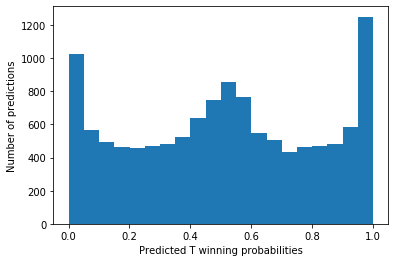

In [66]:
plt.hist(probs, bins = 20)
plt.xlabel("Predicted T winning probabilities")
plt.ylabel("Number of predictions")
plt.show()

# Feature selection and importance

#### 1. Principal component analysis

In [43]:
from sklearn.decomposition import PCA
pca= PCA(0.95)
X = pca.fit_transform(X)
explained_variance = pca.explained_variance_ratio_
n_comp = pca.n_components_
print(n_comp)
print(explained_variance)

33
[0.13669947 0.10118872 0.06320062 0.05569212 0.05217887 0.04577583
 0.04408671 0.03445181 0.03106317 0.03084256 0.02849434 0.02593968
 0.0252235  0.02248299 0.02162887 0.02105454 0.0206583  0.0192111
 0.01568205 0.01503067 0.01491068 0.01392309 0.0126682  0.01263135
 0.0121153  0.01151444 0.01147397 0.0106651  0.01021216 0.0099378
 0.00929426 0.00819915 0.00749517]


#### 2. Pearson Correlation

In [51]:
cor = df.corr()
#Selecting highly correlated features
cor_target = abs(cor["round_winner"])
relevant_features = cor_target[cor_target > 0.2]
print(relevant_features)

alive_players_ct    0.216856
has_defuser         0.248378
has_helmet_ct       0.262222
has_helmet_t        0.235980
armor_ct            0.274438
armor_t             0.224599
ct_firepower        0.280153
t_firepower         0.242636
round_winner        1.000000
Name: round_winner, dtype: float64


#### 3. Tree importance

In [52]:
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(n_estimators=100, max_features= "sqrt", random_state=42, verbose = 0)
model.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [53]:
features = X.columns.to_list() #all features

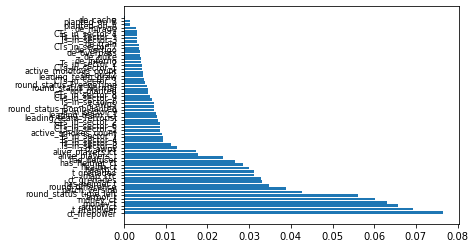

<Figure size 14400x14400 with 0 Axes>

In [58]:
importance = pd.DataFrame({
    'values': model.feature_importances_,
    'features': features}).sort_values(by=["values"], ascending = False) 
plt.barh(importance["features"], importance["values"])
plt.yticks(size= 8)
plt.figure(figsize=(200, 200))
plt.show() 


In [61]:
importance[:10]

,values,features
39,0.076485,ct_firepower
40,0.069397,t_firepower
37,0.065606,armor_ct
33,0.063145,money_t
32,0.060177,money_ct
38,0.056056,armor_t
2,0.042672,round_status_time_left
0,0.038930,patch_version
21,0.034851,round_difference
36,0.033020,has_helmet_t
